# Clustering models churn prediction in banking
In this project we build an AI-based model that helps you assess the chance that customers will churn within banking. The dataset we use for our model is from kaggle at the following link: https://www.kaggle.com/mathchi/churn-for-bank-customers
Content

    RowNumber—corresponds to the record (row) number and has no effect on the output.
    CustomerId—contains random values and has no effect on customer leaving the bank.
    Surname—the surname of a customer has no impact on their decision to leave the bank.
    CreditScore—can have an effect on customer churn, since a customer with a higher credit score is less likely to leave the bank.
    Geography—a customer’s location can affect their decision to leave the bank.
    Gender—it’s interesting to explore whether gender plays a role in a customer leaving the bank.
    Age—this is certainly relevant, since older customers are less likely to leave their bank than younger ones.
    Tenure—refers to the number of years that the customer has been a client of the bank. Normally, older clients are more loyal and less likely to leave a bank.
        Balance—also a very good indicator of customer churn, as people with a higher balance in their accounts are less likely to leave the bank compared to those with lower balances.
        NumOfProducts—refers to the number of products that a customer has purchased through the bank.
        HasCrCard—denotes whether or not a customer has a credit card. This column is also relevant, since people with a credit card are less likely to leave the bank.
        IsActiveMember—active customers are less likely to leave the bank.
        EstimatedSalary—as with balance, people with lower salaries are more likely to leave the bank compared to those with higher salaries.
        Exited—whether or not the customer left the bank.

Acknowledgements

As we know, it is much more expensive to sign in a new client than keeping an existing one.

It is advantageous for banks to know what leads a client towards the decision to leave the company.

Churn prevention allows companies to develop loyalty programs and retention campaigns to keep as many customers as possible. 

### Libraries

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

### Import data

In [2]:
df= pd.read_csv("data/Churn_Modelling.csv")
df= df.drop(["RowNumber", "CustomerId", "Surname"], axis= 1)
df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


Text(0, 0.5, 'EstimatedSalary')

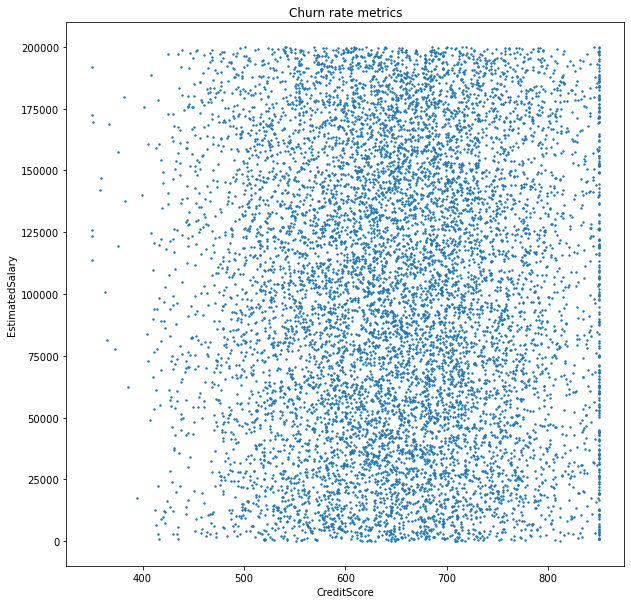

In [3]:
import matplotlib.pyplot as plt

# plot size metrics
fig=plt.figure(figsize=(10,10))
plt.scatter(df['CreditScore'], df['EstimatedSalary'], s=2)
plt.title("Churn rate metrics")
plt.xlabel("CreditScore")
plt.ylabel("EstimatedSalary")

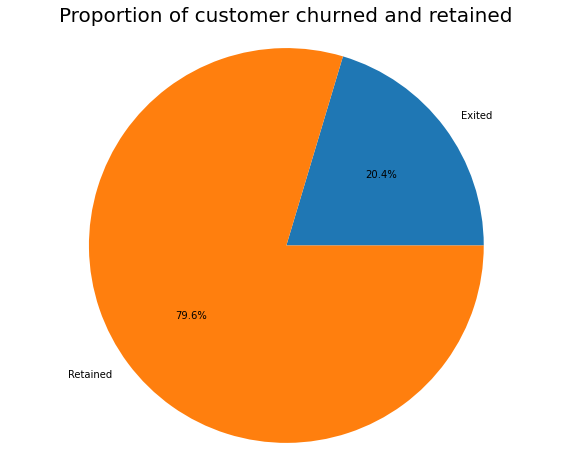

In [4]:

labels = 'Exited', 'Retained'
sizes = [df.Exited[df['Exited']==1].count(), df.Exited[df['Exited']==0].count()]

fig1, ax1 = plt.subplots(figsize=(10, 8))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%')

ax1.axis('equal')
plt.title("Proportion of customer churned and retained", size = 20)
plt.show()

<AxesSubplot:xlabel='IsActiveMember', ylabel='count'>

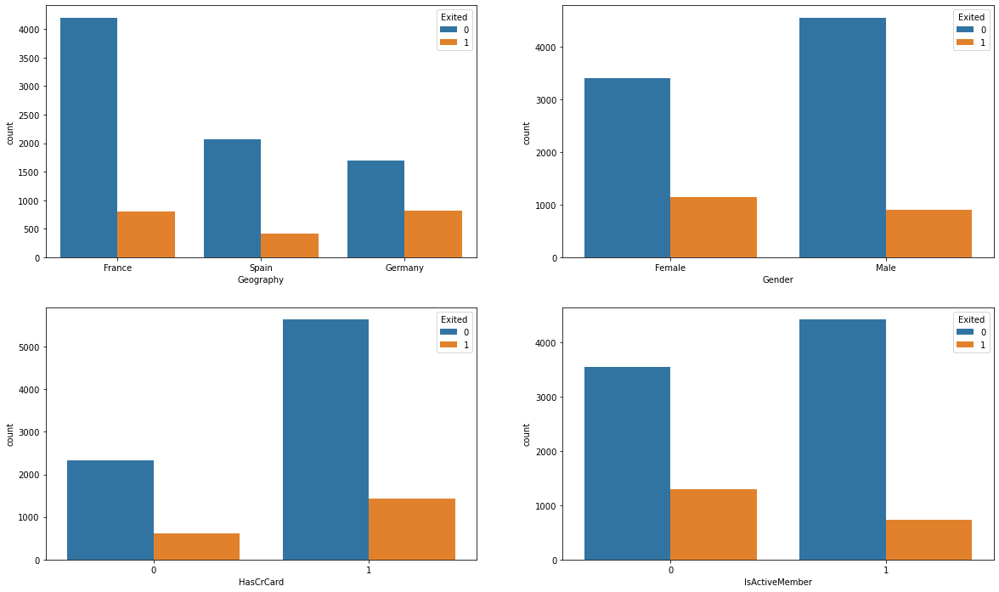

In [5]:
# We first review the 'Status' relation with categorical variables
fig, axarr = plt.subplots(2, 2, figsize=(20, 12))
sns.countplot(x='Geography', hue = 'Exited',data = df, ax=axarr[0][0])
sns.countplot(x='Gender', hue = 'Exited',data = df, ax=axarr[0][1])
sns.countplot(x='HasCrCard', hue = 'Exited',data = df, ax=axarr[1][0])
sns.countplot(x='IsActiveMember', hue = 'Exited',data = df, ax=axarr[1][1])

In [6]:
df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [7]:
unique_vals = df['Geography'].unique()
unique_vals_gender = df['Gender'].unique()
print(unique_vals)
print(unique_vals_gender)

df['Geography'].replace(to_replace=unique_vals,
           value= list(range(len(unique_vals))),
           inplace=True)


df['Gender'].replace(to_replace=unique_vals_gender,
           value= list(range(len(unique_vals_gender))),
           inplace=True)

# Geo: France= 0, Spain= 1, Germany= 2 
# Gender: Female= 0, Male= 1
df

['France' 'Spain' 'Germany']
['Female' 'Male']


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,0,0,42,2,0.00,1,1,1,101348.88,1
1,608,1,0,41,1,83807.86,1,0,1,112542.58,0
2,502,0,0,42,8,159660.80,3,1,0,113931.57,1
3,699,0,0,39,1,0.00,2,0,0,93826.63,0
4,850,1,0,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,0,1,39,5,0.00,2,1,0,96270.64,0
9996,516,0,1,35,10,57369.61,1,1,1,101699.77,0
9997,709,0,0,36,7,0.00,1,0,1,42085.58,1
9998,772,2,1,42,3,75075.31,2,1,0,92888.52,1


In [8]:
from sklearn.cluster import KMeans

# Feature of importance: Age, Balance, Estimated salary, NumOfProducts
# number of Pokémon clusters
size = 4

pokemon_metrics = pd.DataFrame(df[['Age', 'Balance', 'EstimatedSalary', 'NumOfProducts', 
                                   'CreditScore', 'Geography', 'Gender', 'Tenure', ]])

# z-score normalisation
metrics_normalized=(pokemon_metrics-pokemon_metrics.mean())/pokemon_metrics.std()
metrics_normalized = metrics_normalized.rename(columns={'Age': 'age_zscore',
                                                        'Balance':'balance_zscore',
                                                        'EstimatedSalary': 'salary_zscore',
                                                        'NumOfProducts': 'products_zscore',
                                                        'CreditScore': 'credit_zscore',
                                                        'Geography': 'geo_zscore',
                                                        'Gender': 'gender_zscore',
                                                        'Tenure': 'tenure_zscore'
                                                       })

# fit a kmeans object to the dataset
kmeans = KMeans(n_clusters=size, init='k-means++').fit(metrics_normalized)

# clusters is an attribute of the object
cluster_centers = kmeans.cluster_centers_

# add cluster index to dataframe
cluster_labels = pd.Series(kmeans.labels_, name='cluster')
df_cluster_labels = pd.DataFrame(cluster_labels)
metrics_normalized = metrics_normalized.join(df_cluster_labels)

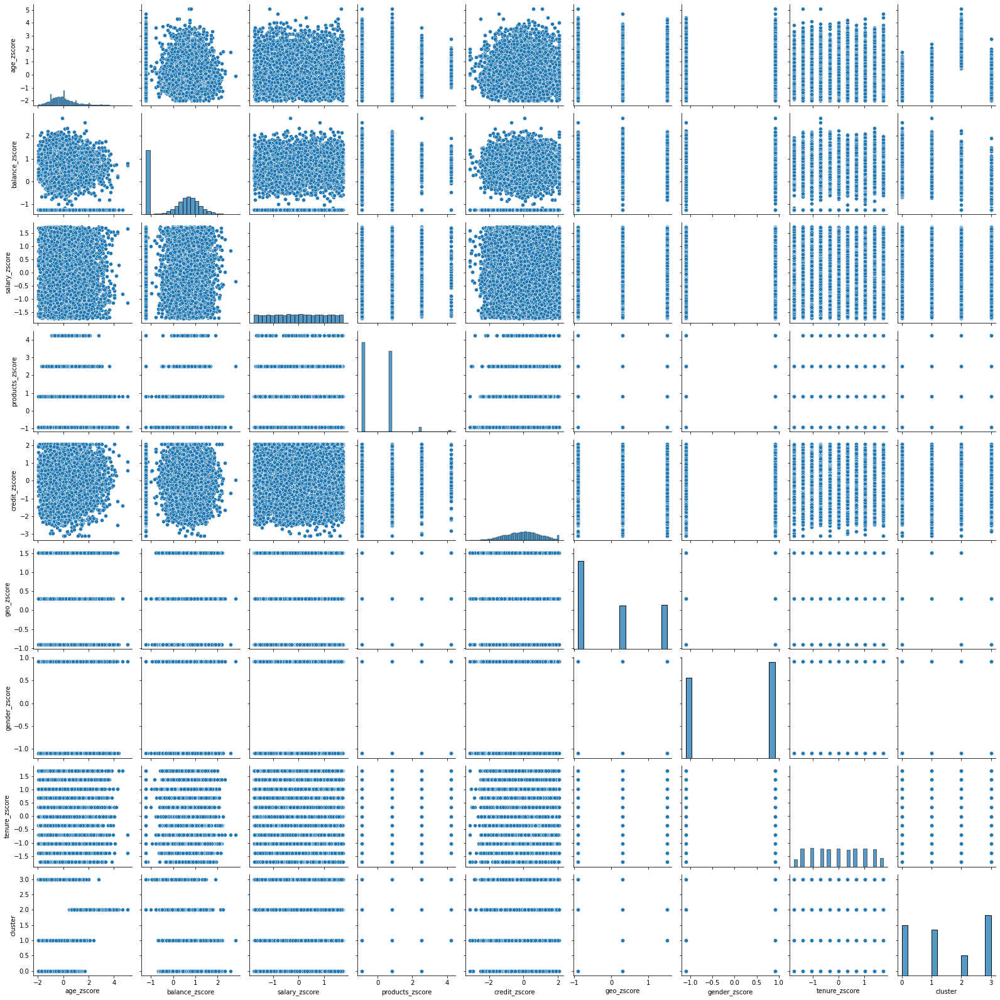

In [9]:
sns.pairplot(metrics_normalized)

In [10]:
#'Age': 'age_zscore'
#'Balance':'balance_zscore'
#'EstimatedSalary': 'salary_zscore'
#'NumOfProducts': 'products_zscore'



import numpy as np        
        
def distance_to_other_clusters(pokemon):
    if not pokemon.loc[pokemon.isin(['age_zscore', 'balance_zscore', 
                                     'salary_zscore', 'products_zscore',
                                     'credit_zscore', 'geo_zscore', 'gender_zscore', 'tenure_zscore'])].all():
        return
    metric = np.array(pokemon[['age_zscore', 'balance_zscore', 
                               'salary_zscore', 'products_zscore',
                               'credit_zscore', 'geo_zscore', 'gender_zscore', 'tenure_zscore']])
    cluster_number = round(pokemon['cluster'])
    distance = 0
    for cluster_index in range(0, len(cluster_centers)):
        if cluster_index == cluster_number:
            continue
        center = cluster_centers[cluster_index]
        distance += np.sqrt(sum(np.square(metric - center)))
    return distance

# evaluate all Pokémon
pokemon_dissimilarity = metrics_normalized.apply(distance_to_other_clusters, axis=1)
pokemon_dissimilarity = pokemon_dissimilarity.rename('dissimilarity')

# join to other metrics
pokemon_processed = metrics_normalized.join(pokemon_dissimilarity.to_frame()).join(df['Exited'].to_frame())

# pick most dissimilar Pokémon per cluster
chosen_pokemon = pd.DataFrame()
for cluster_index in range(0, len(cluster_centers)):
    pokemon_cluster = pokemon_processed[pokemon_processed['cluster'] == cluster_index]
    chosen_pokemon = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])


/tmp/ipykernel_65088/3410668985.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/3410668985.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/3410668985.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/3410668985.py:38: FutureWarning: The frame.append method is depreca

In [11]:
chosen_pokemon

,age_zscore,balance_zscore,salary_zscore,products_zscore,credit_zscore,geo_zscore,gender_zscore,tenure_zscore,cluster,dissimilarity,Exited
9624,0.102805,0.554718,1.255962,-0.911538,-3.109349,-0.902541,-1.095933,-1.733229,0,13.723307,1
7,-0.946032,0.617988,0.334837,4.246164,-2.840346,1.505841,-1.095933,-0.350186,1,18.179478,1
6443,5.060944,0.721623,1.660110,-0.911538,1.060194,-0.902541,0.912374,-0.695947,2,18.334251,0
5235,2.772572,-1.225786,1.326082,4.246164,-0.057202,-0.902541,-1.095933,1.378617,3,18.100032,1


Similarity criteria

In [12]:
# Assign dissimilarity to your Pokémon here

# Manhattan distance

def distance_to_other_clusters(pokemon):
    if not pokemon.loc[pokemon.isin(['age_zscore', 'balance_zscore', 
                                     'salary_zscore', 'products_zscore',
                                     'credit_zscore', 'geo_zscore', 'gender_zscore', 'tenure_zscore'])].all():
        return
    metric = np.array(pokemon[['age_zscore', 'balance_zscore', 
                                     'salary_zscore', 'products_zscore',
                                     'credit_zscore', 'geo_zscore', 'gender_zscore', 'tenure_zscore']])
    cluster_number = round(pokemon['cluster'])
    distance = 0
    for cluster_index in range(0, len(cluster_centers)):
        if cluster_index == cluster_number:
            continue
        center = cluster_centers[cluster_index]
        distance += sum(abs(metric - center)) # Manhattan
    return distance

In [13]:
# evaluate all Pokémon
pokemon_dissimilarity = metrics_normalized.apply(distance_to_other_clusters, axis=1)
pokemon_dissimilarity = pokemon_dissimilarity.rename('dissimilarity')

# join to other metrics
pokemon_processed = metrics_normalized.join(pokemon_dissimilarity.to_frame()).join(df['Exited'].to_frame())

# pick most dissimilar Pokémon per cluster
chosen_pokemon_3 = pd.DataFrame()
for cluster_index in range(0, len(cluster_centers)):
    pokemon_cluster = pokemon_processed[pokemon_processed['cluster'] == cluster_index]
    chosen_pokemon_2 = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])


/tmp/ipykernel_65088/215973894.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon_2 = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/215973894.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon_2 = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/215973894.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  chosen_pokemon_2 = chosen_pokemon.append(pokemon_cluster[pokemon_cluster['dissimilarity']==pokemon_cluster['dissimilarity'].max()])
/tmp/ipykernel_65088/215973894.py:12: FutureWarning: The frame.append method is depre

In [14]:
df_clus= pokemon_processed

In [15]:
df_clus

,age_zscore,balance_zscore,salary_zscore,products_zscore,credit_zscore,geo_zscore,gender_zscore,tenure_zscore,cluster,dissimilarity,Exited
0,0.293503,-1.225786,0.021885,-0.911538,-0.326205,-0.902541,-1.095933,-1.041708,3,20.446266,1
1,0.198154,0.117344,0.216523,-0.911538,-0.440014,0.301650,-1.095933,-1.387468,0,19.450280,0
2,0.293503,1.332987,0.240675,2.526930,-1.536717,-0.902541,-1.095933,1.032856,3,28.928403,1
3,0.007456,-1.225786,-0.108912,0.807696,0.501496,-0.902541,-1.095933,-1.387468,3,23.173104,0
4,0.388852,0.785689,-0.365258,-0.911538,2.063781,0.301650,-1.095933,-1.041708,0,24.611620,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.007456,-1.225786,-0.066416,0.807696,1.246426,-0.902541,0.912374,-0.004426,3,20.854964,0
9996,-0.373939,-0.306363,0.027987,-0.911538,-1.391870,-0.902541,0.912374,1.724377,0,23.639590,0
9997,-0.278590,-1.225786,-1.008593,-0.911538,0.604958,-0.902541,-1.095933,0.687096,3,22.884935,1
9998,0.293503,-0.022606,-0.125224,0.807696,1.256772,1.505841,0.912374,-0.695947,1,22.269447,1


In [32]:
df_clus["cluster"] = kmeans.labels_
df_clus.head()

,age_zscore,balance_zscore,salary_zscore,products_zscore,credit_zscore,geo_zscore,gender_zscore,tenure_zscore,cluster,dissimilarity,Exited
0,0.293503,-1.225786,0.021885,-0.911538,-0.326205,-0.902541,-1.095933,-1.041708,0,20.446266,1
1,0.198154,0.117344,0.216523,-0.911538,-0.440014,0.301650,-1.095933,-1.387468,0,19.450280,0
2,0.293503,1.332987,0.240675,2.526930,-1.536717,-0.902541,-1.095933,1.032856,0,28.928403,1
3,0.007456,-1.225786,-0.108912,0.807696,0.501496,-0.902541,-1.095933,-1.387468,2,23.173104,0
4,0.388852,0.785689,-0.365258,-0.911538,2.063781,0.301650,-1.095933,-1.041708,2,24.611620,0


In [44]:
sns.pairplot(df_clus, hue='cluster', height=10)